<a href="https://colab.research.google.com/github/EvgenEgorov/transcriptomics_msu_HW/blob/main/HW13.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Семинар 13. Дифференцировка клеток. Определение генов, меняющих свою экспрессию по ходу псевдовремени

В этом семинаре мы будем работать с scRNA-seq проходящей дифференцировку поджелудочной железы и применим для анализа алгоритмы RNA velocity и CellRank, после чего самостоятельно идентифицируем гены, меняющие свою экспрессию по ходу псевдовремени, с помощью генерализованных аддитивных моделей (GAM).

In [ ]:
# Install packages
!pip install scikit-misc scanpy cellrank scvelo python-igraph palantir
!pip install rpy2==3.5.1

# Restart runtime
# (it is needed to update Matplotlib version)
import os
os.kill(os.getpid(), 9)

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [1]:
%load_ext rpy2.ipython

!Rscript -e 'install.packages("mgcv")'
!Rscript -e 'install.packages("plyr")'
!Rscript -e 'install.packages("dplyr")'
!Rscript -e 'install.packages("ggplot2")'
!Rscript -e 'install.packages("tidymv")'

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)
trying URL 'https://cran.rstudio.com/src/contrib/mgcv_1.8-41.tar.gz'
Content type 'application/x-gzip' length 1072476 bytes (1.0 MB)
downloaded 1.0 MB

* installing *source* package ‘mgcv’ ...
** package ‘mgcv’ successfully unpacked and MD5 sums checked
** using staged installation
** libs
gcc -I"/usr/share/R/include" -DNDEBUG     -fopenmp -fpic  -g -O2 -fdebug-prefix-map=/build/r-base-ZLat0n/r-base-4.2.2.20221110=. -fstack-protector-strong -Wformat -Werror=format-security -Wdate-time -D_FORTIFY_SOURCE=2  -c coxph.c -o coxph.o
gcc -I"/usr/share/R/include" -DNDEBUG     -fopenmp -fpic  -g -O2 -fdebug-prefix-map=/build/r-base-ZLat0n/r-base-4.2.2.20221110=. -fstack-protector-strong -Wformat -Werror=format-security -Wdate-time -D_FORTIFY_SOURCE=2  -c davies.c -o davies.o
gcc -I"/usr/share/R/include" -DNDEBUG     -fopenmp -fpic  -g -O2 -fdebug-prefix-map=/build/r-base-ZLat0n/r-base-4.2.2.20221110=. -fstack-prot

In [2]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import scanpy as sc
import scanpy.external as sce
import scvelo as scv
import cellrank as cr
import palantir
%matplotlib inline

# Настроим параметры изображений и степень подробности сообщений 
sc.set_figure_params(figsize=(7, 5))
sns.set_theme(style='whitegrid')
cr.settings.verbosity = 2

# Hide some of the warnings
import warnings
warnings.simplefilter("ignore", category=UserWarning)
warnings.simplefilter("ignore", category=FutureWarning)
warnings.simplefilter("ignore", category=DeprecationWarning)

## Pseudotime and differentiation potential with Palantir

Сперва загрузим наш датасет. Он доступен в виде готового объекта AnnData в библиотеке CellRank.

In [3]:
adata = cr.datasets.pancreas()
adata

AnnData object with n_obs × n_vars = 2531 × 27998
    obs: 'day', 'proliferation', 'G2M_score', 'S_score', 'phase', 'clusters_coarse', 'clusters', 'clusters_fine', 'louvain_Alpha', 'louvain_Beta', 'palantir_pseudotime'
    var: 'highly_variable_genes'
    uns: 'clusters_colors', 'clusters_fine_colors', 'day_colors', 'louvain_Alpha_colors', 'louvain_Beta_colors', 'neighbors', 'pca'
    obsm: 'X_pca', 'X_umap'
    layers: 'spliced', 'unspliced'
    obsp: 'connectivities', 'distances'

На этом датасете уже получен UMAP и размечены кластеры

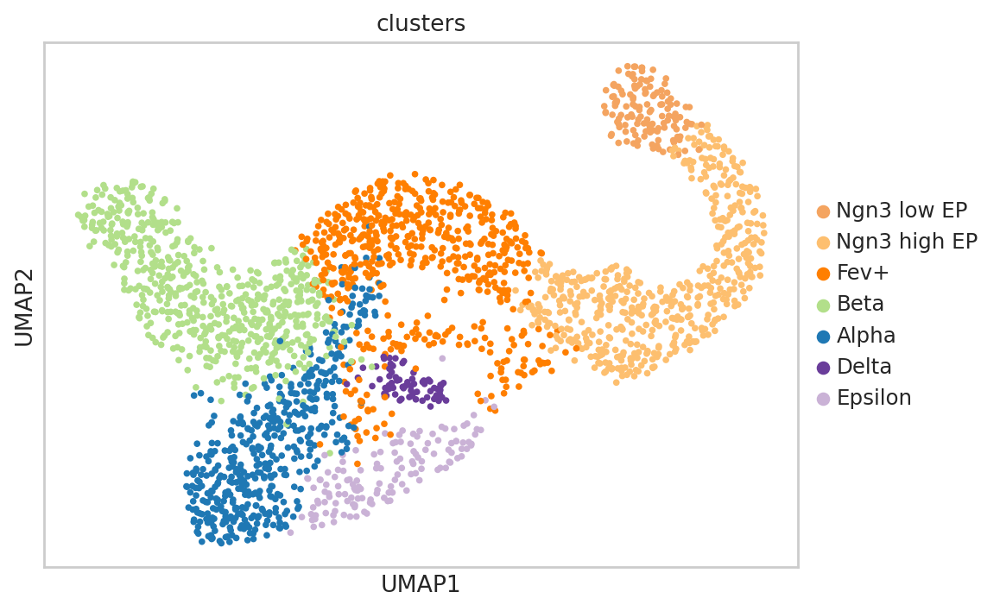

In [4]:
sc.pl.umap(adata, color="clusters")

Проведем стандартный препроцессинг

In [5]:
adata.layers["counts"] = adata.X.copy()
sc.pp.filter_genes(adata, min_counts=3)
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(adata, n_top_genes=1500, subset=True, layer="counts", flavor="seurat_v3")

In [6]:
sc.pp.pca(adata)

С помощью Palantir построим knn-граф в пространстве компонет диффузии

In [7]:
sce.tl.palantir(adata, n_components=5, knn=30)

Determing nearest neighbor graph...


In [8]:
adata

AnnData object with n_obs × n_vars = 2531 × 1500
    obs: 'day', 'proliferation', 'G2M_score', 'S_score', 'phase', 'clusters_coarse', 'clusters', 'clusters_fine', 'louvain_Alpha', 'louvain_Beta', 'palantir_pseudotime'
    var: 'highly_variable_genes', 'n_counts', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm'
    uns: 'clusters_colors', 'clusters_fine_colors', 'louvain_Alpha_colors', 'louvain_Beta_colors', 'neighbors', 'pca', 'log1p', 'hvg', 'palantir_EigenValues'
    obsm: 'X_pca', 'X_umap', 'X_palantir_diff_comp', 'X_palantir_multiscale'
    varm: 'PCs'
    layers: 'spliced', 'unspliced', 'counts', 'palantir_imp'
    obsp: 'connectivities', 'distances', 'palantir_diff_op'

Отрисуем diffusion map по первым двум компонентам

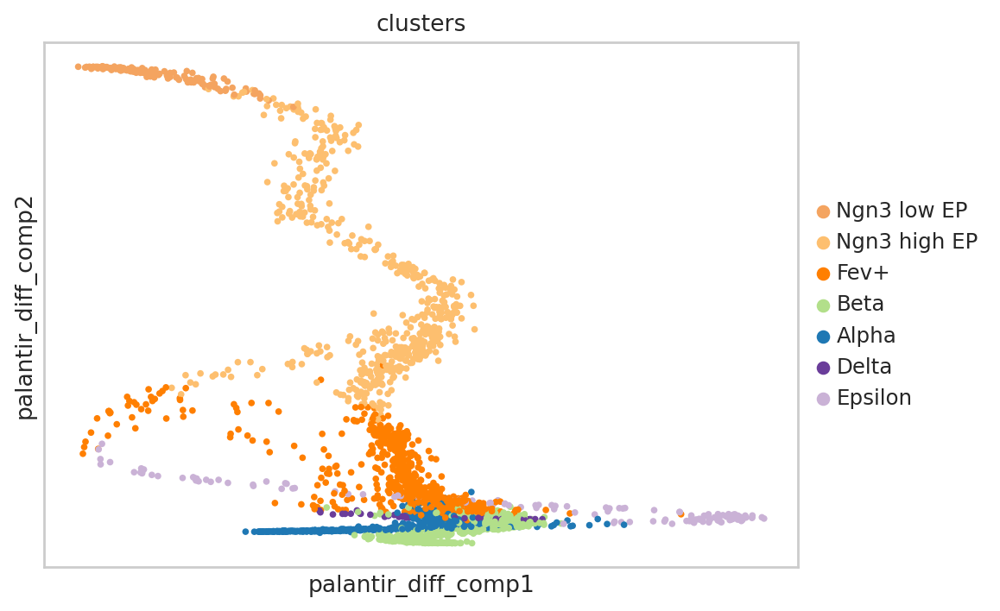

In [9]:
sc.pl.embedding(adata, basis="palantir_diff_comp", color="clusters")

Отрисуем сами комопненты на нашем UMAP

In [10]:
adata.obs["DC1"] = adata.obsm["X_palantir_diff_comp"][:,0]
adata.obs["DC2"] = adata.obsm["X_palantir_diff_comp"][:,1]
adata.obs["DC3"] = adata.obsm["X_palantir_diff_comp"][:,2]

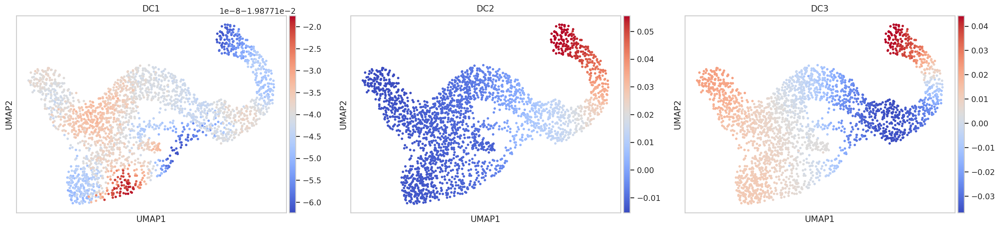

In [11]:
sc.pl.umap(adata, color=["DC1","DC2","DC3"], cmap="coolwarm")

Построим t-SNE по первым двум компонентам диффузии

In [12]:
sc.tl.tsne(adata, n_pcs=2, use_rep='X_palantir_multiscale', perplexity=90)

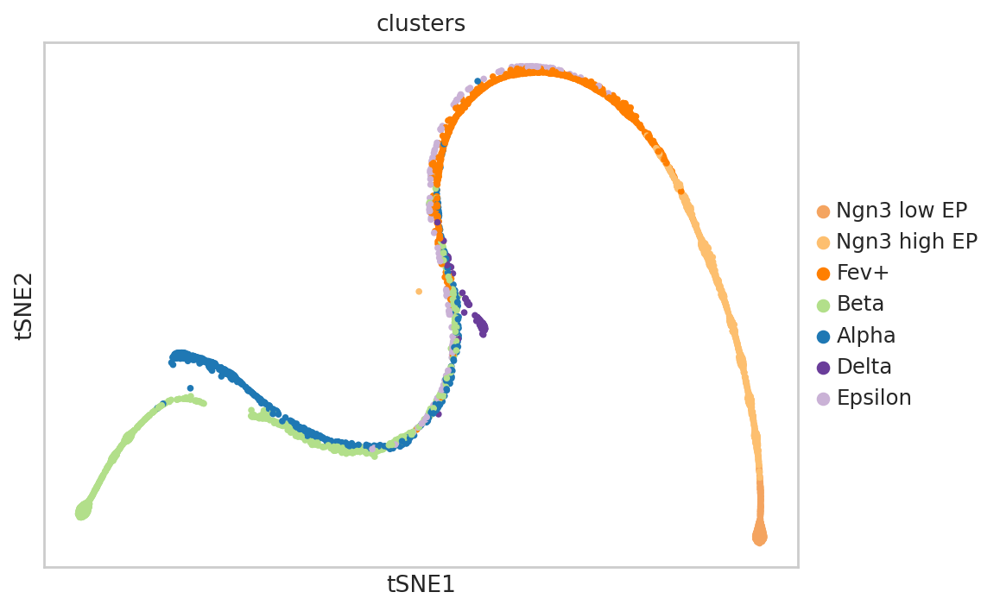

In [13]:
sc.pl.tsne(adata, color="clusters")

Для оценки differentiation potential с помощью Palantir надо указать начальную и терминальные клетки. Попробуем подобрать их "на глаз" по нашим t-SNE и UMAP

In [14]:
cluster_dict = {"Root": adata.obs["clusters"] == "Ngn3 low EP",
                "Alpha": adata.obs["clusters"] == "Alpha",
                "Beta": adata.obs["clusters"] == "Beta",
                "Delta": adata.obs["clusters"] == "Delta",
                "Epsilon": adata.obs["clusters"] == "Epsilon"}

In [15]:
root_cell = adata.obs.index[cluster_dict["Root"]][0]
alpha_cell = adata.obs.index[cluster_dict["Alpha"]][15]
beta_cell = adata.obs.index[cluster_dict["Beta"]][10]
delta_cell = adata.obs.index[cluster_dict["Delta"]][15]
epsilon_cell = adata.obs.index[cluster_dict["Epsilon"]][0]

In [16]:
root_cell

'AAACGGGTCAGCTCTC-1-3'

In [17]:
cluster_cells = {"Root": adata.obs.index==root_cell,
                "Alpha": adata.obs.index==alpha_cell,
                "Beta": adata.obs.index==beta_cell,
                "Delta": adata.obs.index==delta_cell,
                "Epsilon": adata.obs.index==epsilon_cell}

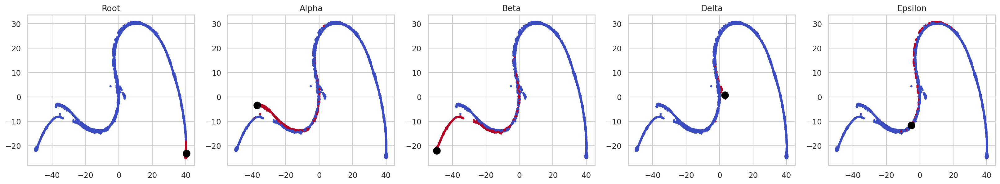

In [18]:
fig,axs = plt.subplots(1,5,figsize=(25,4))
for i, ax in enumerate(fig.axes):
  cur_cluster = list(cluster_dict.keys())[i]
  sns.scatterplot(adata.obsm["X_tsne"][:,0], adata.obsm["X_tsne"][:,1], c=cluster_dict[cur_cluster], ax=ax, cmap="coolwarm", linewidth=0, s=10)
  ax.scatter(adata.obsm["X_tsne"][:,0][cluster_cells[cur_cluster]],
             adata.obsm["X_tsne"][:,1][cluster_cells[cur_cluster]], c="black", s=100)
  ax.set_title(cur_cluster)

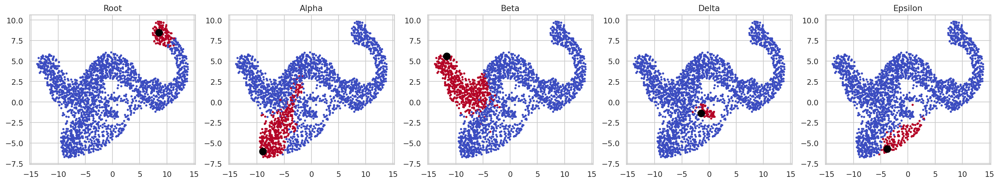

In [19]:
fig,axs = plt.subplots(1,5,figsize=(25,4))
for i, ax in enumerate(fig.axes):
  cur_cluster = list(cluster_dict.keys())[i]
  sns.scatterplot(adata.obsm["X_umap"][:,0], adata.obsm["X_umap"][:,1], c=cluster_dict[cur_cluster], ax=ax, cmap="coolwarm", linewidth=0, s=10)
  ax.scatter(adata.obsm["X_umap"][:,0][cluster_cells[cur_cluster]],
             adata.obsm["X_umap"][:,1][cluster_cells[cur_cluster]], c="black", s=100)
  ax.set_title(cur_cluster)

Запустим Palantir

In [20]:
terminal_states = pd.Series(['Alpha', 'Beta', 'Delta', 'Epsilon'], 
                           index=[alpha_cell, beta_cell, delta_cell, epsilon_cell])

In [21]:
pr_res = sce.tl.palantir_results(
    adata,
    early_cell=root_cell,
    ms_data='X_palantir_multiscale',
    num_waypoints=500,
    terminal_states = terminal_states.index,
)

Sampling and flocking waypoints...
Time for determining waypoints: 0.003928029537200927 minutes
Determining pseudotime...
Shortest path distances using 30-nearest neighbor graph...
Time for shortest paths: 0.12403541803359985 minutes
Iteratively refining the pseudotime...
Correlation at iteration 1: 1.0000
Entropy and branch probabilities...
Markov chain construction...
Computing fundamental matrix and absorption probabilities...
Project results to all cells...


Отрисуем полученные оценки для вероятностей дифференцировки в разные терминальные состояния, а также для differentiation potential

In [22]:
vars(pr_res).keys()

dict_keys(['_pseudotime', '_entropy', '_branch_probs', '_waypoints'])

In [23]:
pr_res.branch_probs.columns = terminal_states[pr_res.branch_probs.columns]

In [24]:
adata.obs["pr_entropy"] = pr_res.entropy
adata.obs["pr_epsilon"] = pr_res.branch_probs["Epsilon"]
adata.obs["pr_beta"] = pr_res.branch_probs["Beta"]
adata.obs["pr_alpha"] = pr_res.branch_probs["Alpha"]
adata.obs["pr_delta"] = pr_res.branch_probs["Delta"]

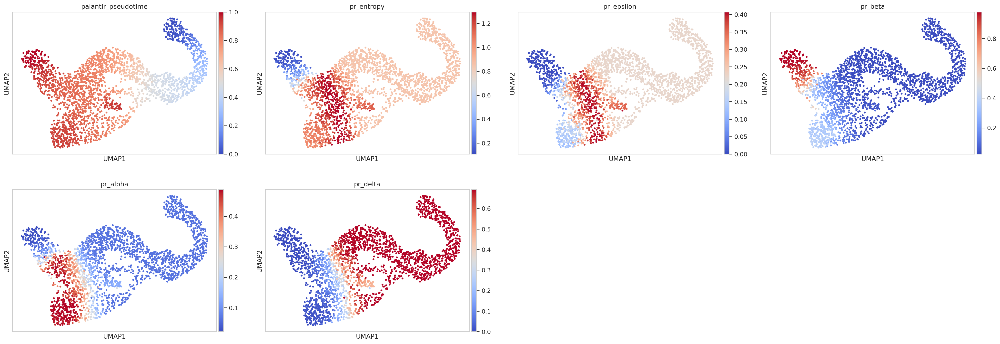

In [25]:
sc.pl.umap(adata, color=["palantir_pseudotime", "pr_entropy", "pr_epsilon", "pr_beta", "pr_alpha", "pr_delta"], cmap="coolwarm")

## RNA velocity with scVelo

Теперь применим RNA velocity. Сначала посмотрим, сколько unspliced каунтов есть в наших данных.

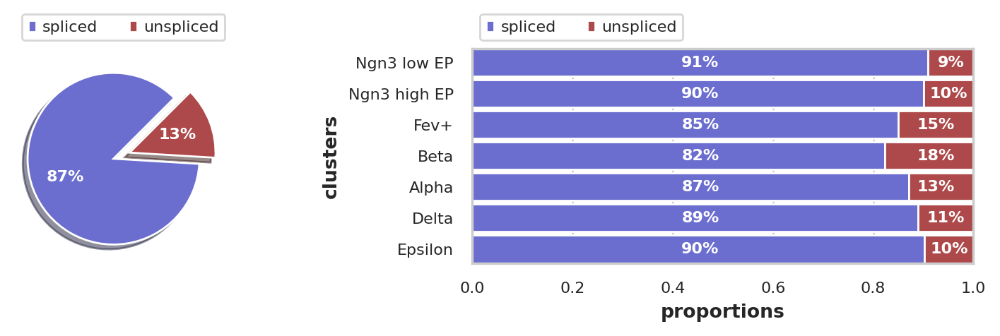

In [26]:
scv.pl.proportions(adata)

Теперь мы можем оценить усредненные по ближайшим соседям средние и дисперсию spliced и unspliced counts:

In [27]:
scv.pp.moments(adata, n_pcs=None, n_neighbors=None)

Normalized count data: spliced, unspliced.
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


Вычислим transcription, splicing и degradation rates для каждого гена, а также латентное время и transcriptional state каждой клетки:

In [28]:
scv.tl.recover_dynamics(adata, n_jobs=-1) # ~5 minutes

recovering dynamics (using 2/2 cores)


  0%|          | 0/762 [00:00<?, ?gene/s]

    finished (0:03:31) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)


Получим оценки для RNA velocity и их графовое представление:

In [29]:
scv.tl.velocity(adata, mode="dynamical")
scv.tl.velocity_graph(adata)

computing velocities
    finished (0:00:01) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 1/2 cores)


  0%|          | 0/2531 [00:00<?, ?cells/s]

    finished (0:00:04) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


Получим общее по всем генам латентное время для каждой клетки:

In [30]:
scv.tl.latent_time(adata)

computing terminal states
    identified 2 regions of root cells and 1 region of end points .
    finished (0:00:00) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)
computing latent time using root_cells as prior
    finished (0:00:00) --> added 
    'latent_time', shared time (adata.obs)


Визуализируем RNA velocity. За что отвечают параметры smooth и min_mass? Попробуйте их изменить.

In [31]:
scv.settings.set_figure_params("scvelo")

computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


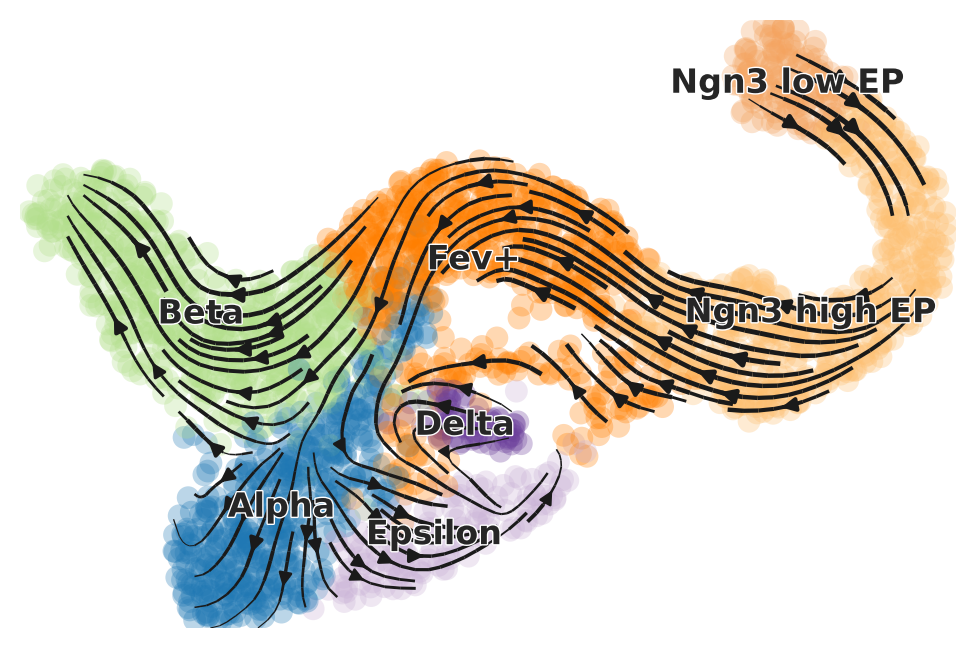

In [32]:
scv.pl.velocity_embedding_stream(
    adata, basis="umap", legend_fontsize=12, title="", smooth=0.4, min_mass=4
)

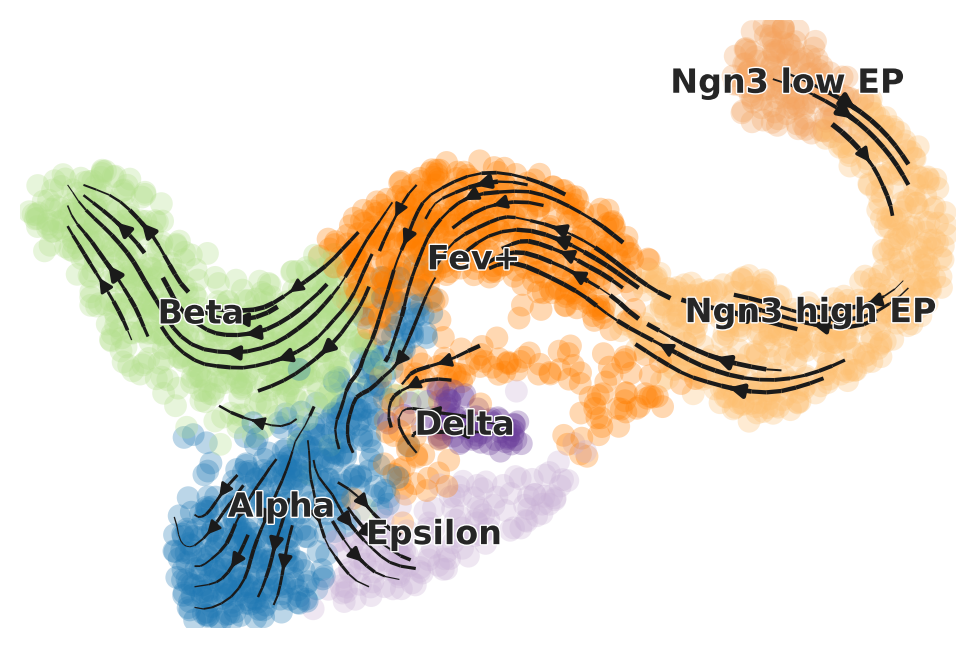

In [33]:
scv.pl.velocity_embedding_stream(
    adata, basis="umap", legend_fontsize=12, title="", smooth=0.2, min_mass=4
)

/usr/local/lib/python3.8/dist-packages/scvelo/plotting/utils.py:869: MatplotlibDeprecationWarning: The draw_all function was deprecated in Matplotlib 3.6 and will be removed two minor releases later. Use fig.draw_without_rendering() instead.
  cb.draw_all()


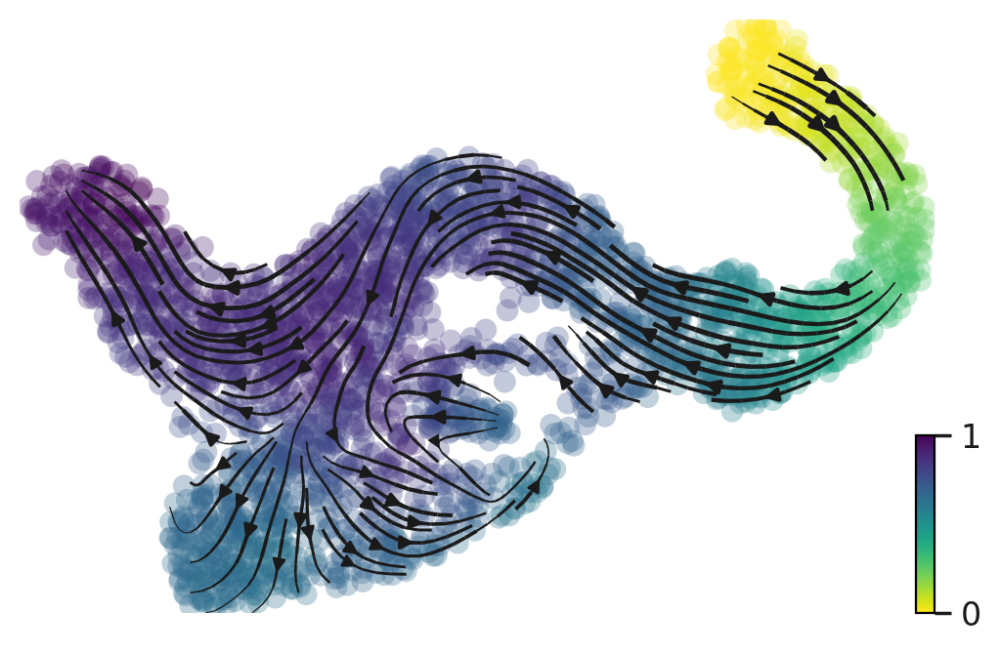

In [34]:
scv.pl.velocity_embedding_stream(
    adata, basis="umap", legend_fontsize=12, title="", smooth=0.4, min_mass=4, color="latent_time"
)

## Fate mapping with CellRank

Теперь на этом же датасете запустим CellRank:

In [35]:
from cellrank.tl.estimators import GPCCA
kernel = cr.tl.transition_matrix(adata, weight_connectivities=0.2, n_jobs=-1, mode='monte_carlo') # ~6 minutes
g = GPCCA(kernel)
g.compute_schur(n_components=20)
g.compute_macrostates(cluster_key="clusters", n_states=12)

Computing transition matrix based on logits using `'monte_carlo'` mode


<ipython-input-35-a48ce29dab50>:2: DeprecationWarning: `cellrank.tl.transition_matrix` will be removed in version `2.0`. Please use the `cellrank.kernels` or `cellrank.estimators` interface instead.
  kernel = cr.tl.transition_matrix(adata, weight_connectivities=0.2, n_jobs=-1, mode='monte_carlo') # ~6 minutes


Estimating `softmax_scale` using `'deterministic'` mode


  0%|          | 0/2531 [00:00<?, ?cell/s]

Setting `softmax_scale=3.7939`


  0%|          | 0/2531 [00:00<?, ?sample/s]

    Finish (0:03:21)
Using a connectivity kernel with weight `0.2`
Computing transition matrix based on `adata.obsp['connectivities']`
    Finish (0:00:00)
Computing Schur decomposition
When computing macrostates, choose a number of states NOT in `[5, 8, 13, 15, 17, 20]`
Adding `adata.uns['eigendecomposition_fwd']`
       `.schur_vectors`
       `.schur_matrix`
       `.eigendecomposition`
    Finish (0:00:21)
Computing `12` macrostates
Adding `.macrostates`
       `.macrostates_memberships`
       `.coarse_T`
       `.coarse_initial_distribution
       `.coarse_stationary_distribution`
       `.schur_vectors`
       `.schur_matrix`
       `.eigendecomposition`
    Finish (0:00:12)


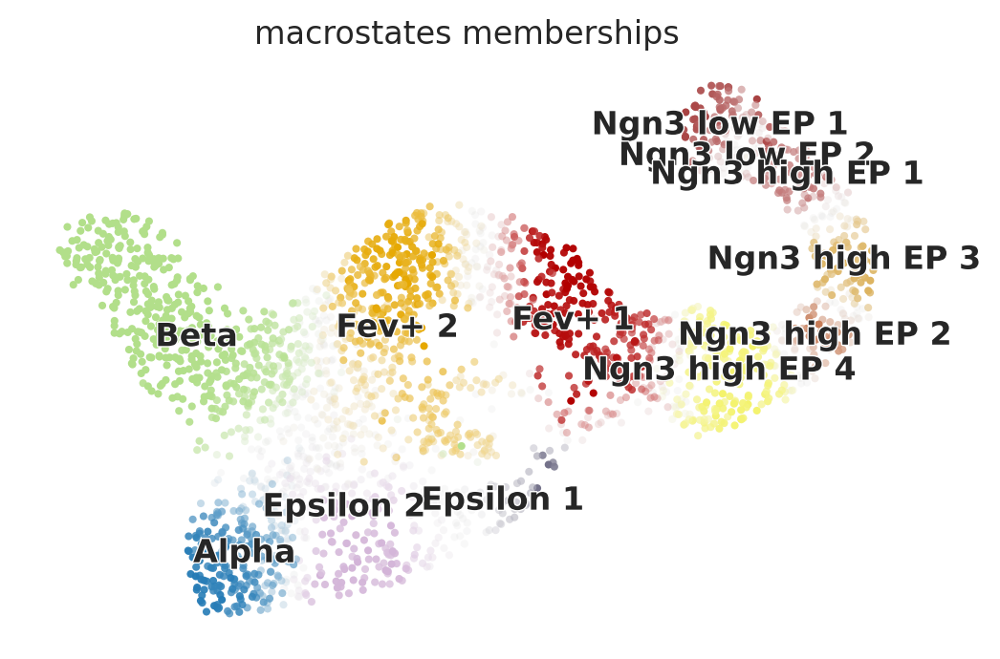

In [36]:
g.plot_macrostates(same_plot=True)

Какие макросостояния соответствуют терминально дифференцированным клеткам?

Укажите их списком, чтобы назначить их терминальными и вычислить absorption probabilities:

In [37]:
g.set_terminal_states_from_macrostates(names=["Alpha","Beta","Epsilon_1"])
g.compute_absorption_probabilities()

Adding `adata.obs['terminal_states']`
       `adata.obs['terminal_states_probs']`
       `.terminal_states`
       `.terminal_states_probabilities`
       `.terminal_states_memberships
    Finish`
Computing absorption probabilities
Defaulting to `'gmres'` solver.


  0%|          | 0/3 [00:00<?, ?/s]

Adding `adata.obsm['to_terminal_states']`
       `.absorption_probabilities`
    Finish (0:00:00)


Визуализируем absorption probabilities: цвет клетки соответствует терминальному состоянию, вероятность прихода к которому максимальна, а интенсивность цвета - значению этой вероятности.

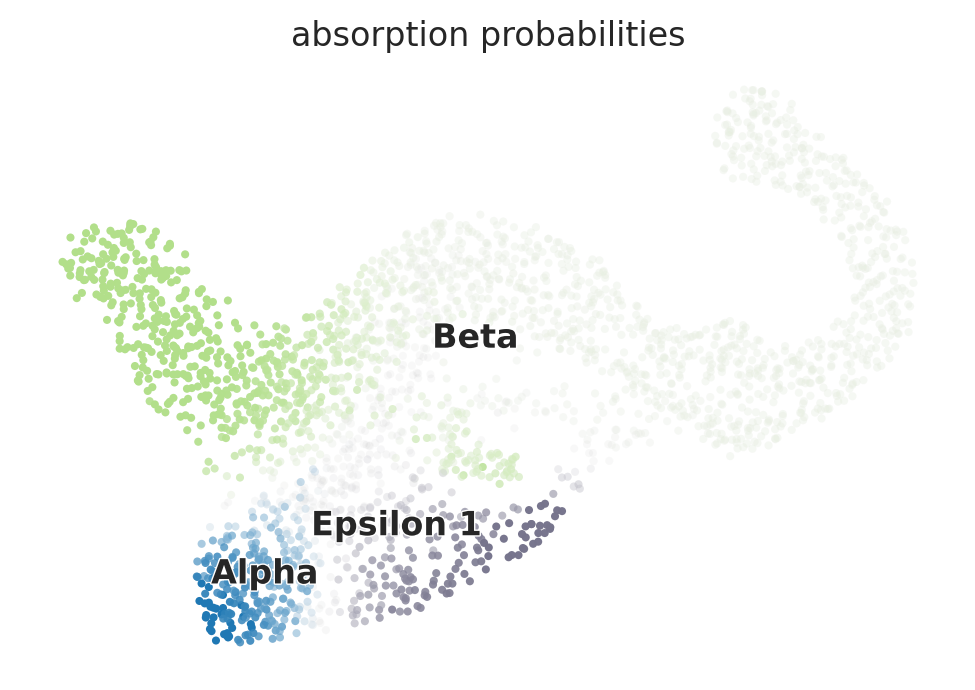

In [38]:
cr.pl.lineages(adata)

Теперь воспользуемся другим рассмотренным на лекции методом - PAGA (partition-based graph abstraction).

In [39]:
scv.tl.paga(
    adata,
    groups="clusters",
    root_key="initial_states_probs",
    end_key="terminal_states_probs",
    use_time_prior="velocity_pseudotime",
)

running PAGA using priors: ['velocity_pseudotime', 'terminal_states_probs']
    finished (0:00:03) --> added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns)
    'paga/transitions_confidence', velocity transitions (adata.uns)


/usr/local/lib/python3.8/dist-packages/networkx/convert.py:158: DeprecationWarning: 

The scipy.sparse array containers will be used instead of matrices
in Networkx 3.0. Use `from_scipy_sparse_array` instead.
  return nx.from_scipy_sparse_matrix(data, create_using=create_using)


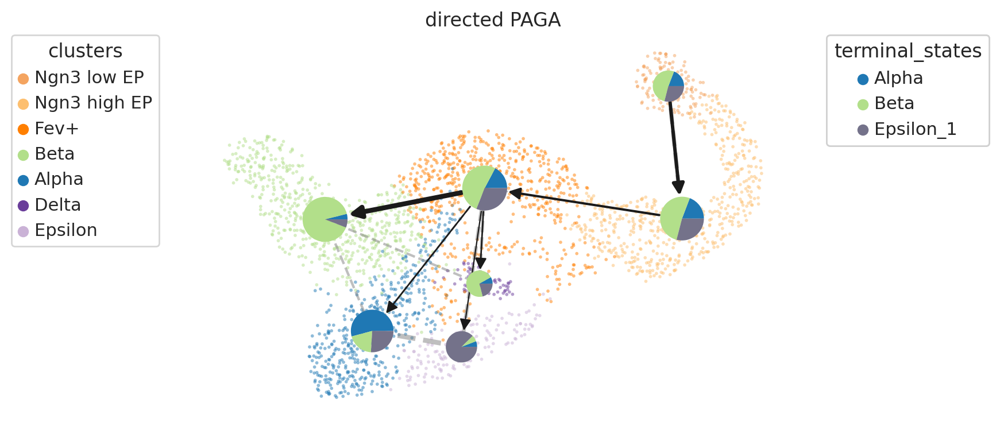

In [40]:
cr.pl.cluster_fates(
    adata,
    mode="paga_pie",
    cluster_key="clusters",
    basis="umap",
    legend_kwargs={"loc": "top right out"},
    legend_loc="top left out",
    node_size_scale=5,
    edge_width_scale=1,
    max_edge_width=4,
    title="directed PAGA",
)

Посчитаем корреляции экспрессии генов с вероятностью дифференцировки в разные терминальные макростояния:

In [41]:
cr.tl.lineage_drivers(adata)

Adding `adata.varm['terminal_lineage_drivers']`
       `.lineage_drivers`
    Finish (0:00:00)


<ipython-input-41-b827be8b05bf>:1: DeprecationWarning: `cellrank.tl.lineage_drivers` will be removed in version `2.0`. Please use the `cellrank.kernels` or `cellrank.estimators` interface instead.
  cr.tl.lineage_drivers(adata)


,Alpha_corr,Alpha_pval,Alpha_qval,Alpha_ci_low,Alpha_ci_high,Beta_corr,Beta_pval,Beta_qval,Beta_ci_low,Beta_ci_high,Epsilon_1_corr,Epsilon_1_pval,Epsilon_1_qval,Epsilon_1_ci_low,Epsilon_1_ci_high
index,,,,,,,,,,,,,,,
Gcg,0.833809,0.000000e+00,0.000000e+00,0.821536,0.845310,-0.547533,7.694925e-210,1.923731e-207,-0.574244,-0.519657,-0.136267,5.412780e-12,2.920565e-11,-0.174304,-0.097825
Irx1,0.596930,1.761158e-262,1.320868e-259,0.571254,0.621439,-0.543770,3.097071e-206,6.636581e-204,-0.570642,-0.515735,0.109533,3.212754e-08,1.302468e-07,0.070874,0.147864
Irx2,0.484648,6.821559e-156,3.410779e-153,0.454264,0.513906,-0.550896,4.163321e-213,1.248996e-210,-0.577463,-0.523163,0.238199,2.715893e-34,4.577348e-33,0.201103,0.274612
Peg10,0.446429,8.287524e-129,3.107821e-126,0.414680,0.477093,-0.309982,1.977221e-58,6.447461e-57,-0.344780,-0.274333,-0.050001,1.186614e-02,2.598425e-02,-0.088790,-0.011061
Wnk3,0.439721,1.943580e-124,5.830740e-122,0.407745,0.470620,-0.325402,1.191790e-64,4.704435e-63,-0.359802,-0.290119,-0.021856,2.717411e-01,3.908070e-01,-0.060766,0.017121
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Sytl4,-0.310193,1.634550e-58,1.066011e-56,-0.344986,-0.274549,0.538446,3.184188e-201,5.970353e-199,0.510187,0.565543,-0.406021,4.669681e-104,4.120307e-102,-0.438053,-0.372959
Ins2,-0.333349,5.205677e-68,3.718341e-66,-0.367538,-0.298261,0.606760,2.867148e-274,1.433574e-271,0.581546,0.630809,-0.474693,1.834472e-148,3.439636e-146,-0.504327,-0.443942
Nnat,-0.355184,8.388491e-78,7.401610e-76,-0.388765,-0.320659,0.648739,0.000000e+00,0.000000e+00,0.625590,0.670747,-0.508837,3.865789e-175,1.449671e-172,-0.537150,-0.479379


Визуализируем на UMAP экспрессию топ-5 генов, скоррелированных с вероятностью дифференцировки клеток в макросостояние Альфа:

/usr/local/lib/python3.8/dist-packages/scvelo/plotting/utils.py:869: MatplotlibDeprecationWarning: The draw_all function was deprecated in Matplotlib 3.6 and will be removed two minor releases later. Use fig.draw_without_rendering() instead.
  cb.draw_all()


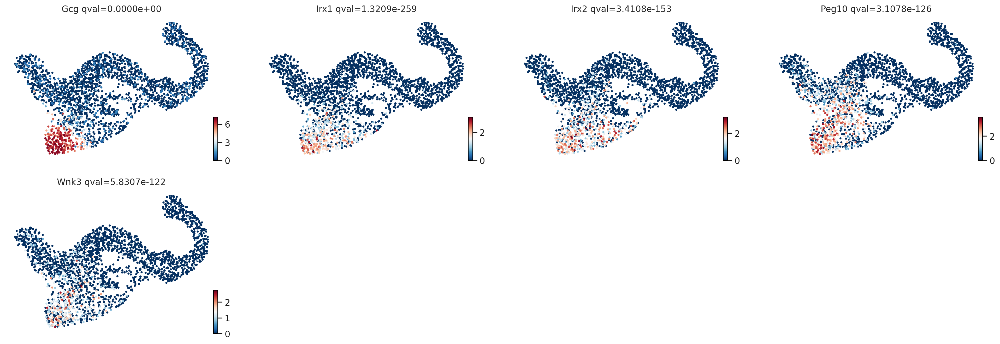

In [42]:
cr.pl.lineage_drivers(adata, lineage="Alpha", n_genes=5)

Датафрейм, который мы напечатали выше, теперь лежит в `adata.varm['terminal_lineage_drivers']`. Выведите топ 100 генов, скоррелированных с дифференцировкой в макросостояние Бета:

In [47]:
adata.varm['terminal_lineage_drivers'].sort_values(by = "Beta_corr", ascending = False)[0:100]

,Alpha_corr,Alpha_pval,Alpha_qval,Alpha_ci_low,Alpha_ci_high,Beta_corr,Beta_pval,Beta_qval,Beta_ci_low,Beta_ci_high,Epsilon_1_corr,Epsilon_1_pval,Epsilon_1_qval,Epsilon_1_ci_low,Epsilon_1_ci_high
index,,,,,,,,,,,,,,,
Nnat,-0.355184,8.388491e-78,7.401610e-76,-0.388765,-0.320659,0.648739,0.000000e+00,0.000000e+00,0.625590,0.670747,-0.508837,3.865789e-175,1.449671e-172,-0.537150,-0.479379
Gng12,-0.359924,4.841095e-80,6.051369e-78,-0.393370,-0.325527,0.620734,6.985067e-292,5.238800e-289,0.596191,0.644118,-0.465606,6.436511e-142,1.072752e-139,-0.495578,-0.434527
Ins2,-0.333349,5.205677e-68,3.718341e-66,-0.367538,-0.298261,0.606760,2.867148e-274,1.433574e-271,0.581546,0.630809,-0.474693,1.834472e-148,3.439636e-146,-0.504327,-0.443942
Pdx1,-0.358551,2.177347e-79,2.512323e-77,-0.392036,-0.324117,0.591629,2.556468e-256,9.586756e-254,0.565708,0.616383,-0.427354,1.164683e-116,1.455854e-114,-0.458678,-0.394968
Sytl4,-0.310193,1.634550e-58,1.066011e-56,-0.344986,-0.274549,0.538446,3.184188e-201,5.970353e-199,0.510187,0.565543,-0.406021,4.669681e-104,4.120307e-102,-0.438053,-0.372959
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Tmem65,-0.064546,1.154638e-03,3.892039e-03,-0.103248,-0.025649,0.193979,5.171932e-23,4.941336e-22,0.156197,0.231193,-0.196276,1.550023e-23,1.614608e-22,-0.233452,-0.158526
Gjd2,-0.187499,1.425935e-21,2.403261e-20,-0.224819,-0.149630,0.193288,7.410203e-23,7.035003e-22,0.155497,0.230513,-0.065085,1.049013e-03,2.763456e-03,-0.103783,-0.026189
1700086L19Rik,-0.020173,3.103823e-01,4.721841e-01,-0.059088,0.018804,0.192965,8.760375e-23,8.264505e-22,0.155170,0.230196,-0.241899,2.352471e-35,4.151419e-34,-0.278239,-0.204868


Визуализируйте изменение экспрессии нескольких из этих генов с ходом псевдовремени с помощью GAM:

Computing trends using `1` core(s)


  0%|          | 0/3 [00:00<?, ?gene/s]

    Finish (0:00:00)
Plotting trends


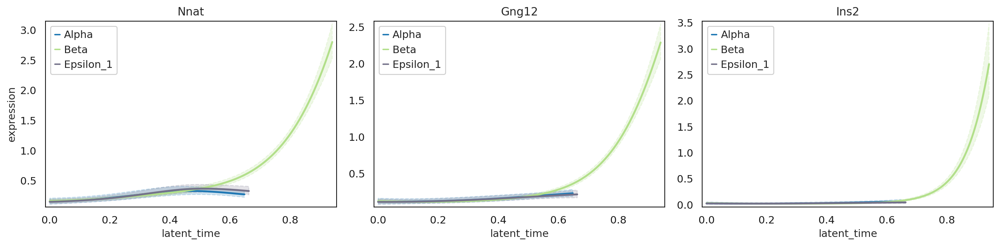

In [49]:
warnings.simplefilter("ignore", category=DeprecationWarning)
cr_gam = cr.ul.models.GAM(adata)
cr.pl.gene_trends(
    adata,
    model=cr_gam,
    data_key="X",
    genes=["Nnat","Gng12","Ins2"],
    ncols=3,
    time_key="latent_time",
    same_plot=True,
    hide_cells=True,
    figsize=(15, 4),
    n_test_points=200,
)

## Реализация алгоритма определения генов, меняющих свою экспрессию с ходом псевдовремени

CellRank позволяет сопоставить экспрессию генов с подсчитанными им вероятностями разных путей дифференцировки, но интересно может быть просто получить список генов, меняющих свою экспрессию с ходом псевдовремени вдоль какой-то из траекторий развития.

На лекции мы обсудили, что для этой цели подходят генерализованные аддитивные модели (GAM). Их можно строить либо с помощью пакета mgcv для R, либо с помощью питоновской библиотеки pyGAM. Мы воспользуемся первым способом, поскольку это позволит нам удобным образом делать F-тест для сравнения двух моделей: $g_i \sim t_i$ и  $g_i \sim 1$. Так мы сможем выделить гены, чья экспрессия значимо меняется.

Мы воспользуемся готовым F-тестом для моделей, но его можно реализовать и самостоятельно. Это может пригодиться, например, в более сложных случаях, когда вы оцениваете значимость изменений экспрессии гена сразу на нескольких траекториях, обучая модели с разным числом степеней свободы.

Присвоим переменной `ngn3_trajectory` сабсет нашей `adata` - клетки, относящиеся к кластерам "Ngn3 low EP" и "Ngn3 high EP":

In [52]:
ngn3_trajectory = adata[adata.obs["clusters"].isin(["Ngn3 low EP", "Ngn3 high EP"])]

Визуализируйте `ngn3_trajectory` с помощью UMAP, покрасив его по `palantir_pseudotime`:

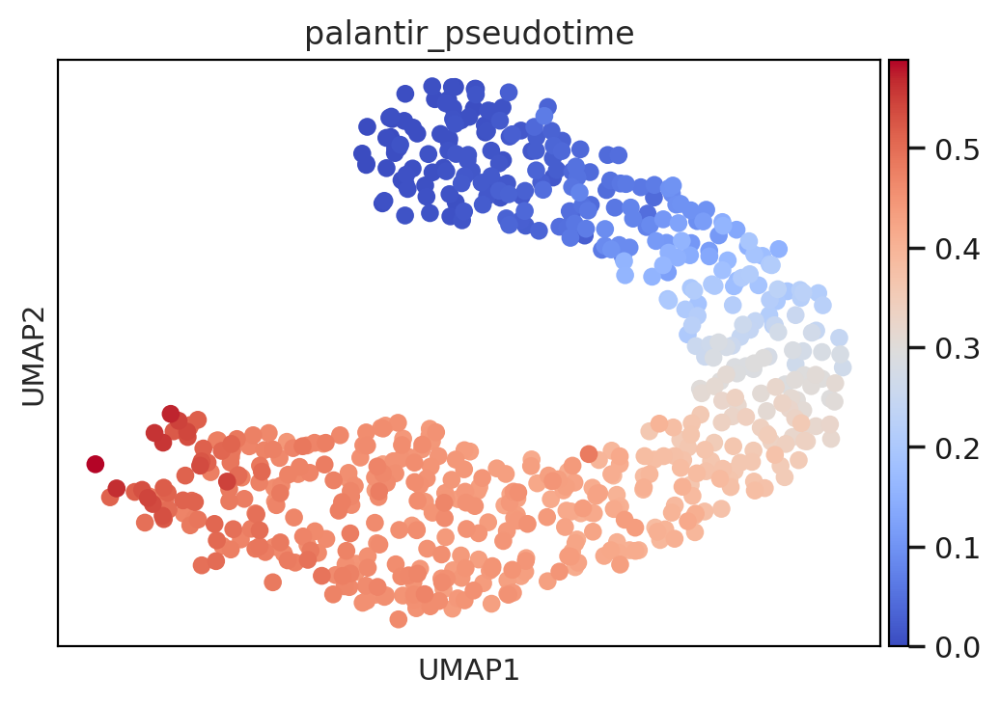

In [53]:
sc.pl.umap(ngn3_trajectory, color=["palantir_pseudotime"], cmap="coolwarm")

Давайте подготовим несколько переменных для экспорта в R и проверим, что всё прошло успешно:

In [54]:
ngn3_genes = ngn3_trajectory.X.A
pseudotime = ngn3_trajectory.obs["palantir_pseudotime"]
ngn3_genenames = ngn3_trajectory.var.index
clusters = ngn3_trajectory.obs["clusters"]

In [55]:
%%R -i ngn3_genes,pseudotime,ngn3_genenames,clusters

print(pseudotime[1:5])
print(ngn3_genes[1:4,1:4])
print(ngn3_genenames[1:5])
print(clusters[1:5])

AAACCTGGTAAGTGGC-1-3 AAACGGGTCAAACAAG-1-3 AAACGGGTCAGCTCTC-1-3 
         0.489743181          0.353005836          0.010139365 
AAAGATGAGTGAACAT-1-3 AAATGCCCACATCTTT-1-3 
         0.002723775          0.291464687 
          [,1]      [,2] [,3] [,4]
[1,] 0.0000000 1.0954225    0    0
[2,] 0.0000000 0.0000000    0    0
[3,] 0.9925408 0.0000000    0    0
[4,] 1.2598616 0.8164557    0    0
[1] "Sbspon"  "Mcm3"    "Rims1"   "Col19a1" "Neurl3" 
AAACCTGGTAAGTGGC-1-3 AAACGGGTCAAACAAG-1-3 AAACGGGTCAGCTCTC-1-3 
        Ngn3 high EP         Ngn3 high EP          Ngn3 low EP 
AAAGATGAGTGAACAT-1-3 AAATGCCCACATCTTT-1-3 
         Ngn3 low EP         Ngn3 high EP 
Levels: Ngn3 low EP Ngn3 high EP


Давайте для начала протестируем какой-нибудь один ген. Заполните пропуски в формуле:

In [56]:
%%R
library(mgcv)

model_time <- gam(gene~s(t,k=5),data=data.frame("gene"=ngn3_genes[,1],"t"=pseudotime))
model_const <- gam(gene~1,data=data.frame("gene"=ngn3_genes[,1],"t"=pseudotime))

#perform overrided anova for S3 class gam
as.list(anova(model_time, model_const, test="F"))
anova(model_time, model_const, test="F")

Analysis of Deviance Table

Model 1: gene ~ s(t, k = 5)
Model 2: gene ~ 1
  Resid. Df Resid. Dev      Df Deviance      F    Pr(>F)    
1    662.11     49.176                                      
2    666.00     62.859 -3.8932  -13.684 47.346 < 2.2e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1


Воспользуемся функциями семейство `a-ply` из `plyr`, чтобы протестировать сразу все гены. В один список мы сохраним сами модели, чтобы можно было потом отрисовывать их предсказания, а в другой - p-value F-теста для этих моделей:

In [57]:
%%R -o gam_signif
library(plyr)

gam_time <- alply(ngn3_genes, 2, function(gene,pseudotime) {
    gam(gene~s(t,k=5), data=data.frame("gene"=gene,"t"=pseudotime))
},pseudotime)

gam_signif <- aaply(ngn3_genes, 2, function(gene,pseudotime) {
    model_time <- gam(gene~s(t,k=5), data=data.frame("gene"=gene,"t"=pseudotime))
    model_const <- gam(gene~1, data=data.frame("gene"=gene))
    #perform overrided anova for S3 class gam
    anova(model_time, model_const, test='F')$`Pr(>F)`[2]
},pseudotime)
gam_signif <- p.adjust(gam_signif, method = "bonferroni")

names(gam_time) <- ngn3_genenames
names(gam_signif) <- ngn3_genenames

Выведите 10 наиболее значимых генов:

In [58]:
%%R

names(sort(gam_signif))[1:10]

 [1] "Spp1"          "Btbd17"        "1700011H14Rik" "Cck"          
 [5] "Anxa2"         "Gadd45a"       "Bicc1"         "Map1b"        
 [9] "Mgst1"         "Atp1b1"       


Создадим датафрейм с информацией об экспрессии генов, а также с предсказаниями модели для одного из генов, полученных выше:

In [60]:
%%R
library(tidymv)

genes_df <- as.data.frame(ngn3_genes)
colnames(genes_df) <- ngn3_genenames
genes_df["pseudotime"] <- pseudotime
genes_df["clusters"] <- clusters

gene <- "Spp1"

model_pred <- predict_gam(gam_time[gene][[1]])

    to check out the in-progress replacement tidygam
    (https://github.com/stefanocoretta/tidygam).



Посмотрите с помощью `head()`, как выглядит датафрейм `model_pred` и визуализируйте предсказания GAM и экспрессию для наиболее значимых генов:

In [61]:
%%R

head(model_pred)

# A tibble: 6 × 3
       t   fit se.fit
   <dbl> <dbl>  <dbl>
1 0       4.61 0.0659
2 0.0120  4.55 0.0556
3 0.0240  4.50 0.0486
4 0.0360  4.45 0.0461
5 0.0481  4.40 0.0481
6 0.0601  4.37 0.0529


Attaching package: ‘dplyr’



    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize



    collapse



    filter, lag



    intersect, setdiff, setequal, union




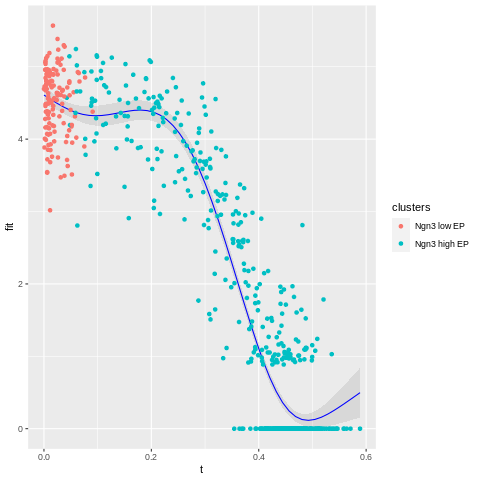

In [62]:
%%R
library(ggplot2)
library(dplyr)

ggplot(model_pred, aes(t, fit)) +
  geom_smooth_ci(color="blue") +
  geom_point(aes_string("pseudotime",gene,color="clusters"),data=genes_df)

Отрисуйте экспрессию этих генов на UMAP:

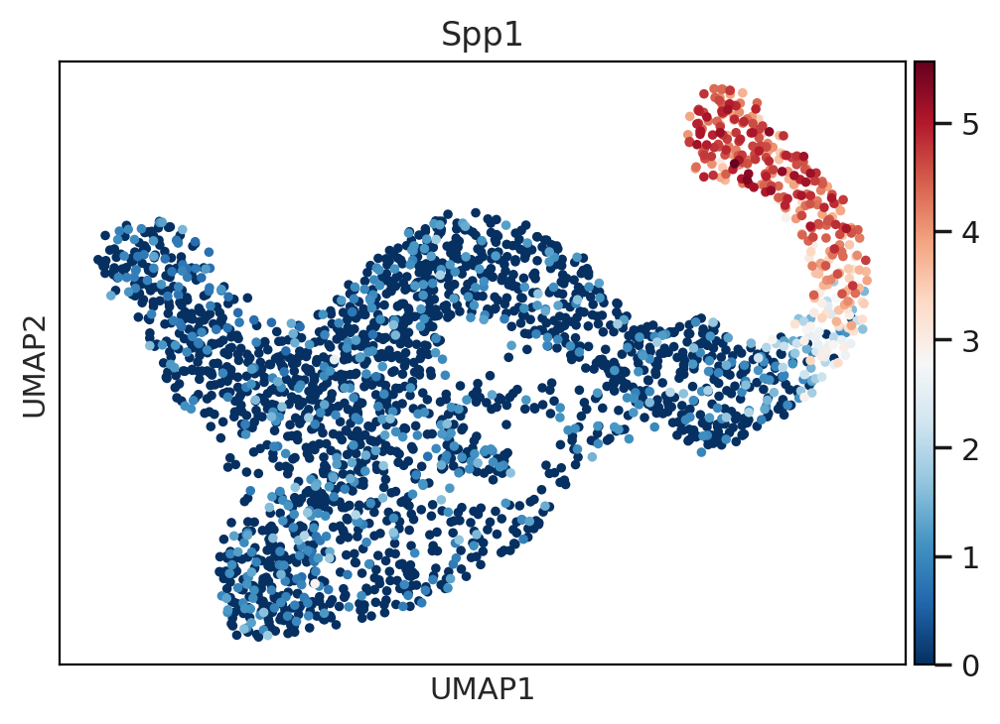

In [65]:
sc.pl.umap(adata,color="Spp1")

## Домашнее задание

Palantir смог хорошо идентифицировать как терминальное состояние, из которого клетки уже не могут перейти в другие типы, только бета-клетки.

Попробуйте исключить из `adata` кластеры, соответствующие дельта- и эпсилон-клеткам, и запустить Palantir еще раз, теперь уже с двумя терминальными состояниями: альфа и бета. Как изменилась оценка энтропии для клеток? Какие выводы можно из этого сделать?

In [7]:
adata

AnnData object with n_obs × n_vars = 2531 × 1500
    obs: 'day', 'proliferation', 'G2M_score', 'S_score', 'phase', 'clusters_coarse', 'clusters', 'clusters_fine', 'louvain_Alpha', 'louvain_Beta', 'palantir_pseudotime'
    var: 'highly_variable_genes', 'n_counts', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm'
    uns: 'clusters_colors', 'clusters_fine_colors', 'louvain_Alpha_colors', 'louvain_Beta_colors', 'neighbors', 'pca', 'log1p', 'hvg'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'spliced', 'unspliced', 'counts'
    obsp: 'connectivities', 'distances'

In [85]:
adata_for_hw = adata[(adata.obs["clusters"]!="Delta")&(adata.obs["clusters"]!="Epsilon")]

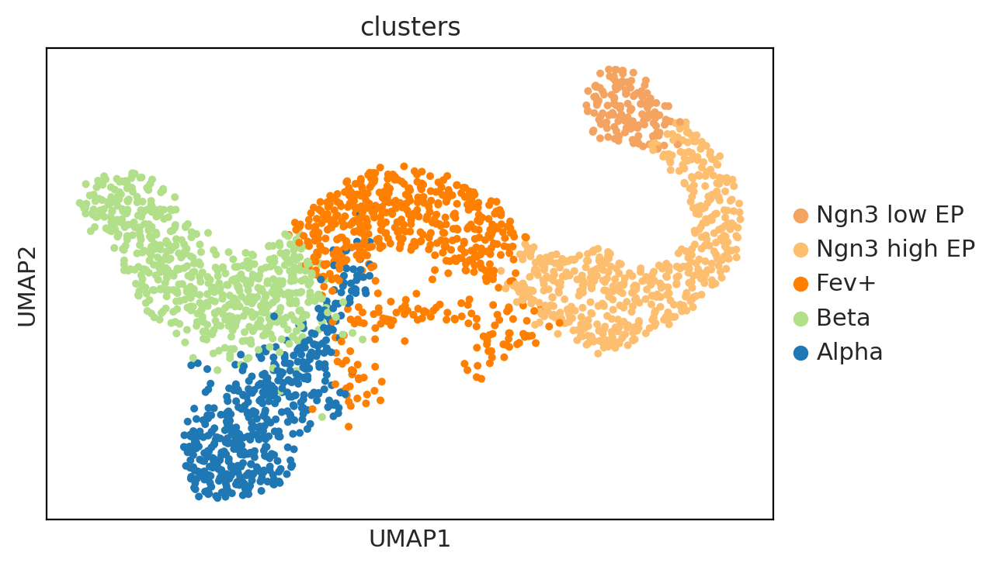

In [86]:
sc.pl.umap(adata_for_hw, color = "clusters")

In [87]:
sce.tl.palantir(adata_for_hw, n_components=5, knn=30)

Determing nearest neighbor graph...


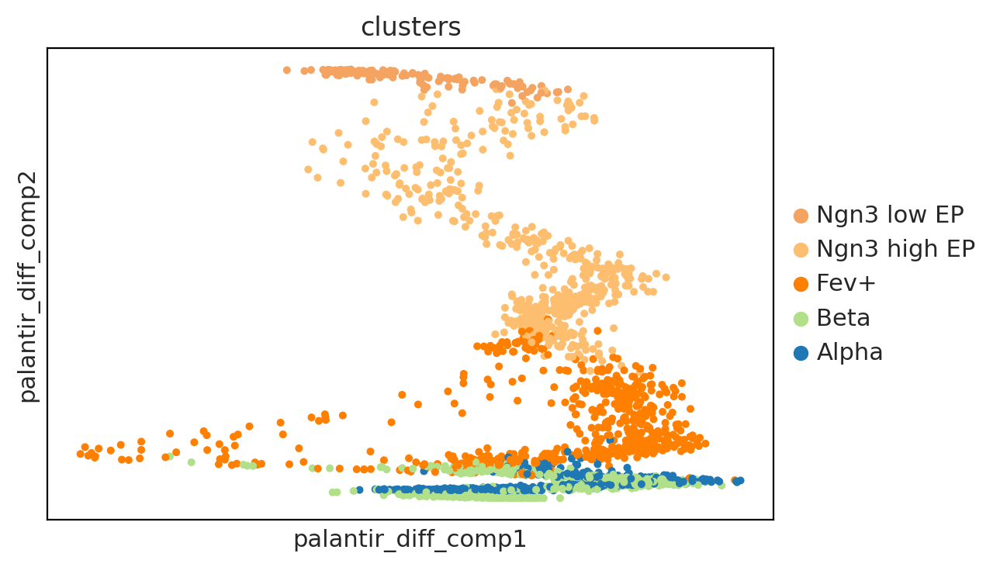

In [88]:
sc.pl.embedding(adata_for_hw, basis="palantir_diff_comp", color="clusters")

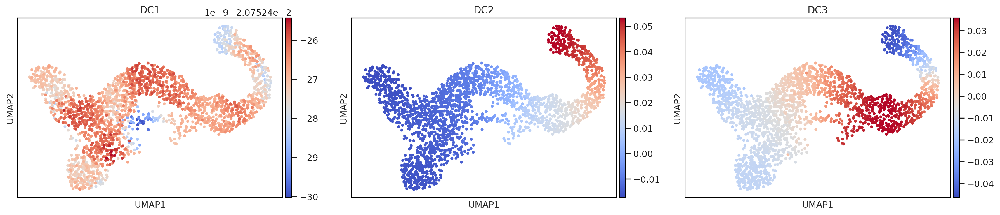

In [89]:
adata_for_hw.obs["DC1"] = adata_for_hw.obsm["X_palantir_diff_comp"][:,0]
adata_for_hw.obs["DC2"] = adata_for_hw.obsm["X_palantir_diff_comp"][:,1]
adata_for_hw.obs["DC3"] = adata_for_hw.obsm["X_palantir_diff_comp"][:,2]
sc.pl.umap(adata_for_hw, color=["DC1","DC2","DC3"], cmap="coolwarm")

Оценка энтропии для первой компоненты изменилась значительно, прежде её значение было максимал

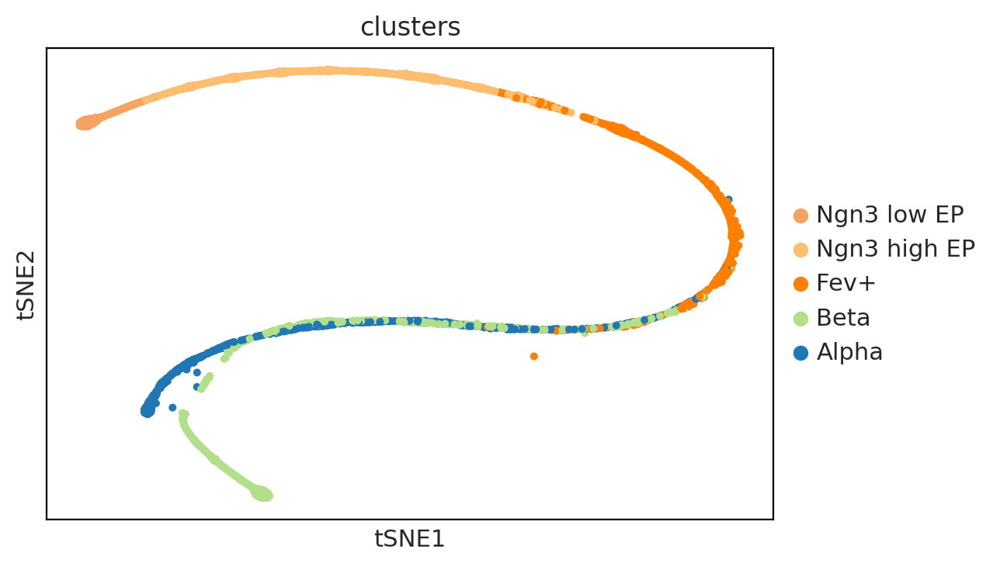

In [90]:
sc.tl.tsne(adata_for_hw, n_pcs=2, use_rep='X_palantir_multiscale', perplexity=90)
sc.pl.tsne(adata_for_hw, color="clusters")

In [91]:
terminal_states = pd.Series(['Alpha', 'Beta'], 
                           index=[alpha_cell, beta_cell])

pr_res = sce.tl.palantir_results(
    adata_for_hw,
    early_cell=root_cell,
    ms_data='X_palantir_multiscale',
    num_waypoints=500,
    terminal_states = terminal_states.index,
)


Sampling and flocking waypoints...
Time for determining waypoints: 0.0021057764689127604 minutes
Determining pseudotime...
Shortest path distances using 30-nearest neighbor graph...
Time for shortest paths: 0.11132903099060058 minutes
Iteratively refining the pseudotime...
Correlation at iteration 1: 1.0000
Entropy and branch probabilities...
Markov chain construction...
Computing fundamental matrix and absorption probabilities...
Project results to all cells...


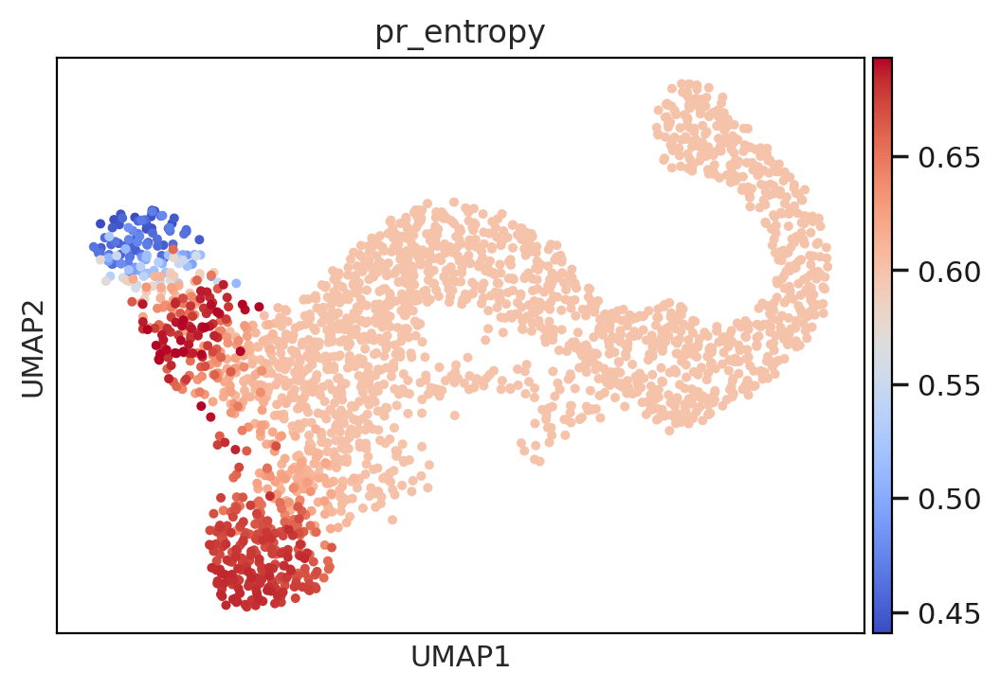

In [92]:
adata_for_hw.obs["pr_entropy"] = pr_res.entropy
sc.pl.umap(adata_for_hw, color= "pr_entropy", cmap="coolwarm")

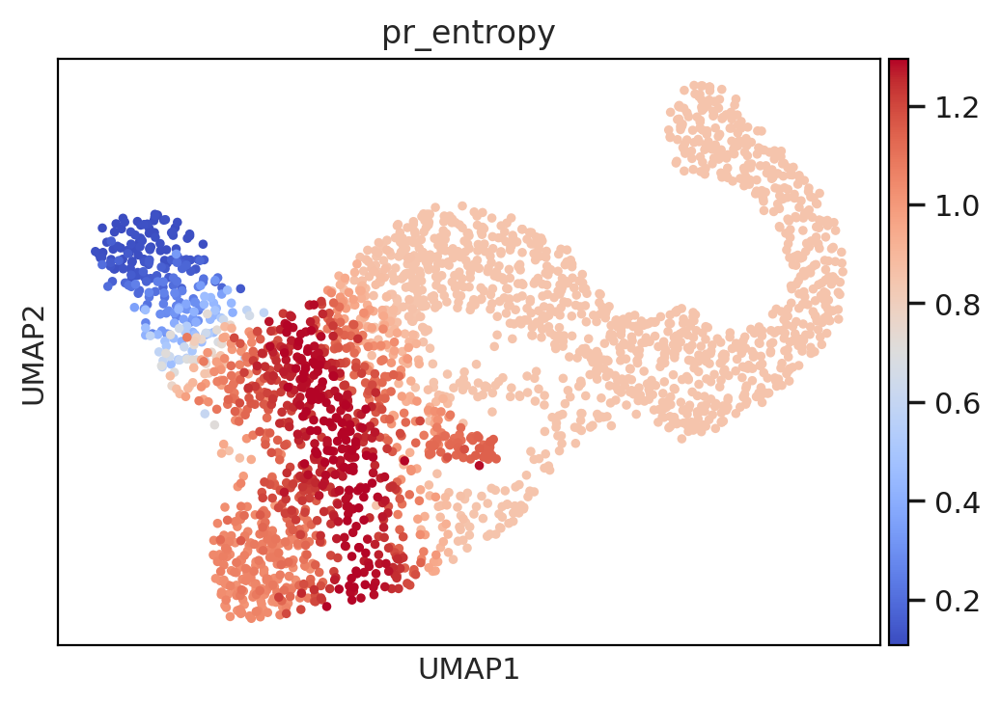

In [93]:
#Для сравнения посмотрим на значение энтропии в исходном датасете (с кластера Epsilon и Delta)
sc.pl.umap(adata, color= "pr_entropy", cmap="coolwarm")

Оценка энтропии изменилась - она значительно уменьшилась, это заметно даже по шкале измерений (раньше максимальное значение было 1.2 или примерно так, а теперь - только 0.65). Это происходит потому, что теперь энтропия в среднем меньше - меньше траекторий дифференцировки, доступных для каждой клетки.
<br><br>
К тому же распределение энтропии сместилось - раньше, как я понимаю, максимум энтропии был в точке "соприкосновения" терминальных состояний (кластеро Delta, Epsilon,Alpha и Beta). Теперь кластера всего два, и рядом с точкой ветвления ("выбора траектории") наблюдается наибольшее значение энтропии.

#  **Вторая часть домашнего задания** 

При запуске Palantir мы выбирали терминальные клетки "на глаз". Попробуем сделать это, воспользовавшись результатами CellRank.

Для этого с помощью результатов работы CellRank выделите гены, высоко скоррелированные с дифференцировкой только эпсилон-клеток, но не других типов клеток.

Подсказка: выберите кажущиеся вам разумными пороги по корреляции экспрессии генов с вероятностью дифференцировки в Эпсилон-макросостояние и в другие состояния, отфильтруйте по этим значениям строки датафрейма `adata.varm['terminal_lineage_drivers']`. Добейтесь того, чтобы получить от нескольких штук до нескольких десятков генов.

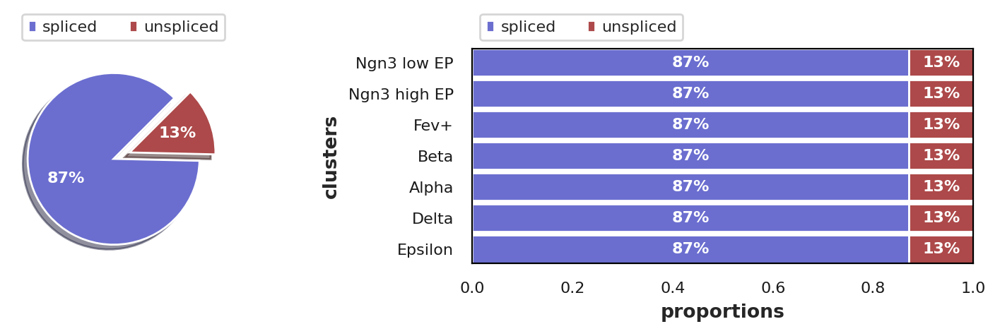

In [68]:
scv.pl.proportions(adata)

In [69]:
scv.pp.moments(adata, n_pcs=None, n_neighbors=None)
scv.tl.recover_dynamics(adata, n_jobs=-1) # ~5 minutes
scv.tl.velocity(adata, mode="dynamical")
scv.tl.velocity_graph(adata)
scv.tl.latent_time(adata)

computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
recovering dynamics (using 2/2 cores)


  0%|          | 0/628 [00:00<?, ?gene/s]

    finished (0:02:53) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)
computing velocities
    finished (0:00:01) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 1/2 cores)


  0%|          | 0/2531 [00:00<?, ?cells/s]

    finished (0:00:05) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing latent time using root_cells as prior
    finished (0:00:00) --> added 
    'latent_time', shared time (adata.obs)


In [70]:
scv.settings.set_figure_params("scvelo")

computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


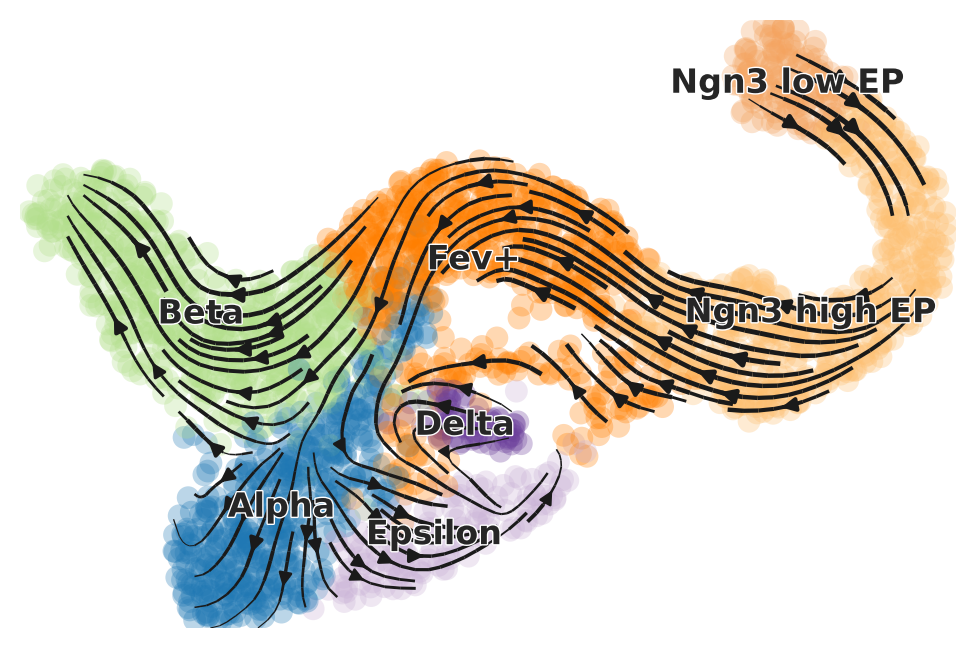

In [71]:
scv.pl.velocity_embedding_stream(
    adata, basis="umap", legend_fontsize=12, title="", smooth=0.4, min_mass=4
)

In [72]:
from cellrank.tl.estimators import GPCCA
kernel = cr.tl.transition_matrix(adata, weight_connectivities=0.2, n_jobs=-1, mode='monte_carlo') # ~6 minutes
g = GPCCA(kernel)
g.compute_schur(n_components=20)
g.compute_macrostates(cluster_key="clusters", n_states=12)


Computing transition matrix based on logits using `'monte_carlo'` mode


<ipython-input-72-a48ce29dab50>:2: DeprecationWarning: `cellrank.tl.transition_matrix` will be removed in version `2.0`. Please use the `cellrank.kernels` or `cellrank.estimators` interface instead.
  kernel = cr.tl.transition_matrix(adata, weight_connectivities=0.2, n_jobs=-1, mode='monte_carlo') # ~6 minutes


Estimating `softmax_scale` using `'deterministic'` mode


  0%|          | 0/2531 [00:00<?, ?cell/s]

Setting `softmax_scale=3.7939`


  0%|          | 0/2531 [00:00<?, ?sample/s]

    Finish (0:03:15)
Using a connectivity kernel with weight `0.2`
Computing transition matrix based on `adata.obsp['connectivities']`
    Finish (0:00:00)
Computing Schur decomposition
When computing macrostates, choose a number of states NOT in `[5, 8, 13, 15, 17, 20]`
Adding `adata.uns['eigendecomposition_fwd']`
       `.schur_vectors`
       `.schur_matrix`
       `.eigendecomposition`
    Finish (0:00:23)
Computing `12` macrostates
Adding `.macrostates`
       `.macrostates_memberships`
       `.coarse_T`
       `.coarse_initial_distribution
       `.coarse_stationary_distribution`
       `.schur_vectors`
       `.schur_matrix`
       `.eigendecomposition`
    Finish (0:00:13)


In [73]:
g.set_terminal_states_from_macrostates(names=["Alpha","Beta","Epsilon_1"])
g.compute_absorption_probabilities()

Adding `adata.obs['terminal_states']`
       `adata.obs['terminal_states_probs']`
       `.terminal_states`
       `.terminal_states_probabilities`
       `.terminal_states_memberships
    Finish`
Computing absorption probabilities


  0%|          | 0/3 [00:00<?, ?/s]

Adding `adata.obsm['to_terminal_states']`
       `.absorption_probabilities`
    Finish (0:00:00)


In [74]:
cr.tl.lineage_drivers(adata)

Adding `adata.varm['terminal_lineage_drivers']`
       `.lineage_drivers`
    Finish (0:00:00)


<ipython-input-74-b827be8b05bf>:1: DeprecationWarning: `cellrank.tl.lineage_drivers` will be removed in version `2.0`. Please use the `cellrank.kernels` or `cellrank.estimators` interface instead.
  cr.tl.lineage_drivers(adata)


,Alpha_corr,Alpha_pval,Alpha_qval,Alpha_ci_low,Alpha_ci_high,Beta_corr,Beta_pval,Beta_qval,Beta_ci_low,Beta_ci_high,Epsilon_1_corr,Epsilon_1_pval,Epsilon_1_qval,Epsilon_1_ci_low,Epsilon_1_ci_high
index,,,,,,,,,,,,,,,
Gcg,0.833317,0.000000e+00,0.000000e+00,0.821011,0.844848,-0.546954,2.779249e-209,6.948123e-207,-0.573690,-0.519053,-0.137376,3.624399e-12,1.962671e-11,-0.175399,-0.098944
Irx1,0.596735,2.985961e-262,2.239471e-259,0.571050,0.621253,-0.542662,3.488963e-205,7.476349e-203,-0.569581,-0.514580,0.107802,5.288671e-08,2.115468e-07,0.069130,0.146150
Irx2,0.484327,1.197692e-155,5.988458e-153,0.453931,0.513597,-0.550102,2.477588e-212,7.432765e-210,-0.576703,-0.522335,0.237238,5.087336e-34,8.574161e-33,0.200126,0.273671
Peg10,0.446000,1.590853e-128,5.965699e-126,0.414236,0.476678,-0.308947,5.005335e-58,1.632174e-56,-0.343771,-0.273275,-0.051388,9.708672e-03,2.151109e-02,-0.090170,-0.012451
Wnk3,0.439484,2.760038e-124,8.280113e-122,0.407500,0.470392,-0.324268,3.525437e-64,1.391620e-62,-0.358698,-0.288956,-0.023555,2.362025e-01,3.483812e-01,-0.062459,0.015421
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Sytl4,-0.311076,7.372780e-59,5.026895e-57,-0.345846,-0.275452,0.539317,4.901618e-202,9.190533e-200,0.511094,0.566377,-0.406350,3.034788e-104,2.677754e-102,-0.438372,-0.373298
Ins2,-0.334397,1.843406e-68,1.316719e-66,-0.368557,-0.299335,0.607795,1.539509e-275,7.697547e-273,0.582631,0.631796,-0.475111,9.062020e-149,1.699129e-146,-0.504729,-0.444375
Nnat,-0.356302,2.506642e-78,2.506642e-76,-0.389852,-0.321808,0.649614,0.000000e+00,0.000000e+00,0.626509,0.671578,-0.508970,2.997109e-175,1.123916e-172,-0.537277,-0.479517


In [75]:
corr_data = adata.varm['terminal_lineage_drivers']

In [76]:
corr_data

,Alpha_corr,Alpha_pval,Alpha_qval,Alpha_ci_low,Alpha_ci_high,Beta_corr,Beta_pval,Beta_qval,Beta_ci_low,Beta_ci_high,Epsilon_1_corr,Epsilon_1_pval,Epsilon_1_qval,Epsilon_1_ci_low,Epsilon_1_ci_high
index,,,,,,,,,,,,,,,
Sbspon,-0.013276,5.044304e-01,6.660613e-01,-0.052211,0.025699,-0.014906,4.535603e-01,6.167604e-01,-0.053836,0.024070,0.034443,0.083195,0.145616,-0.004525,0.073306
Mcm3,-0.008726,6.608402e-01,7.867028e-01,-0.047672,0.030246,-0.006130,7.579200e-01,8.738509e-01,-0.045081,0.032840,0.017631,0.375319,0.495622,-0.021346,0.056554
Rims1,-0.011891,5.499116e-01,7.044128e-01,-0.050829,0.027084,0.016606,4.037152e-01,5.696828e-01,-0.022371,0.055532,-0.010057,0.613070,0.711381,-0.049000,0.028916
Col19a1,0.064729,1.117778e-03,3.784800e-03,0.025832,0.103430,-0.028767,1.479606e-01,2.635877e-01,-0.067653,0.010206,-0.029403,0.139193,0.224747,-0.068287,0.009570
Neurl3,0.009305,6.398755e-01,7.724480e-01,-0.029667,0.048250,-0.003790,8.488784e-01,9.395546e-01,-0.042745,0.035177,-0.004699,0.813239,0.868227,-0.043653,0.034269
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Rai2,0.163346,1.160032e-16,1.380990e-15,0.125181,0.201028,-0.066627,7.938080e-04,2.209113e-03,-0.105316,-0.027738,-0.082348,0.000033,0.000104,-0.120922,-0.043526
Tmem27,0.378712,2.514925e-89,3.772387e-87,0.344839,0.411601,-0.267088,4.272413e-43,9.026225e-42,-0.302898,-0.230525,-0.037149,0.061670,0.111857,-0.076000,0.001816
Gpm6b,-0.011057,5.782246e-01,7.258050e-01,-0.049998,0.027916,-0.016886,3.958261e-01,5.627859e-01,-0.055811,0.022090,0.034794,0.080100,0.141353,-0.004174,0.073656


In [80]:
selected_genes = list(corr_data[(corr_data["Epsilon_1_corr"]>=0.4)&(corr_data["Alpha_corr"]<=0.1)&(corr_data["Beta_corr"]<=0.1)].index)
selected_genes

['Arg1', 'Cdkn1a', 'Gm11837', 'Ghrl', 'Anpep', 'Mboat4']

Отрисуйте экспрессию этих генов на UMAP

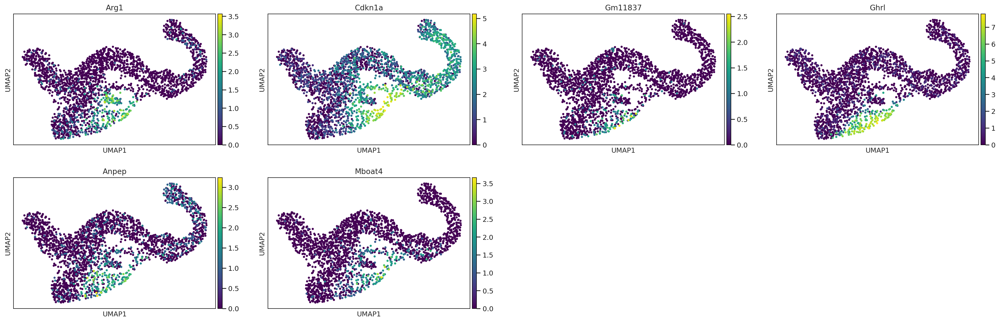

In [81]:
sc.pl.umap(adata, color=selected_genes, cmap="viridis")

Получите индекс клетки, в которой общая экспрессия этих генов выше, чем в остальных. Отрисуйте эту клетку на UMAP и t-SNE аналогично тому, как мы делали это на семинаре для терминальных клеток Palantir.

Согласуется ли положение этой клетки:

*   с тем, как выглядит дифференцировка на t-SNE, потсроенном по полученным Palantir'ом компонентам диффузии?
*   с тем, какую оценку изменения экспрессии дал scVelo? (посмотрите на UMAP со спроецированными на него предсказаниями RNA velocity)

С учетом того, что для определения скоррелированных с дифференцировкой генов вы использовали CellRank, является это неожиданным или же закономерным?

Text(0.5, 1.0, 'Epsilon')

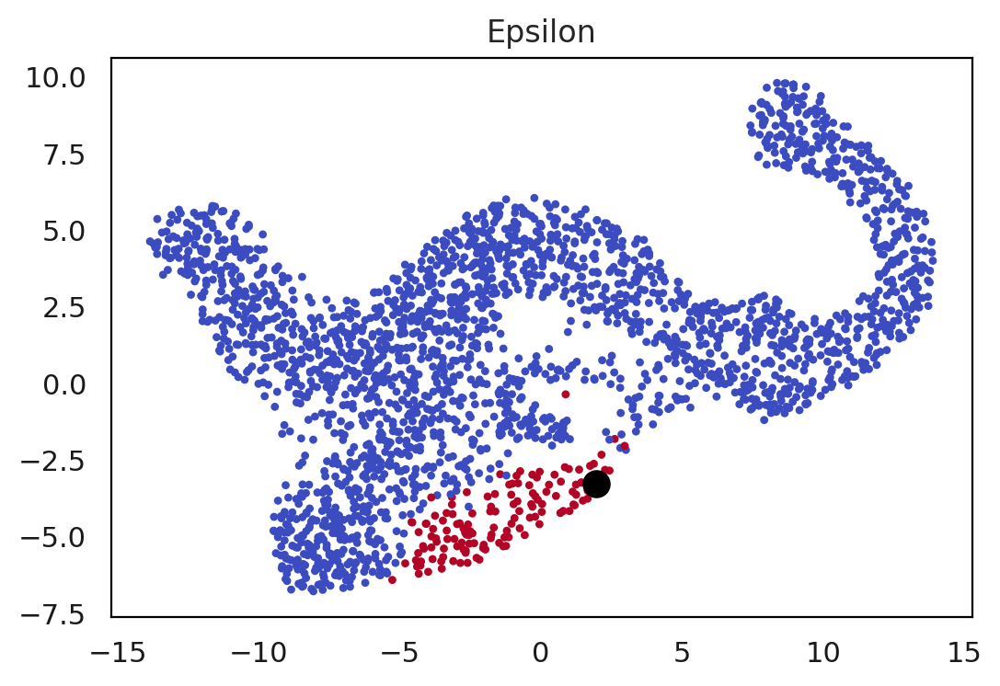

In [82]:
#Определяем индекс клетки
adata_subset = adata[:,selected_genes]
target_cell = adata_subset[adata_subset.X.sum(axis=1).argmax()].obs.index


#Визуализируем
cluster_dict = {"Root": adata.obs["clusters"] == "Ngn3 low EP",
                "Alpha": adata.obs["clusters"] == "Alpha",
                "Beta": adata.obs["clusters"] == "Beta",
                "Delta": adata.obs["clusters"] == "Delta",
                "Epsilon": adata.obs["clusters"] == "Epsilon"}


sns.scatterplot(adata.obsm["X_umap"][:,0], adata.obsm["X_umap"][:,1],c=cluster_dict["Epsilon"], cmap="coolwarm", linewidth=0, s=10)
plt.scatter(adata.obsm["X_umap"][:,0][adata.obs.index == target_cell[0]], adata.obsm["X_umap"][:,1][adata.obs.index == target_cell[0]], c="black", s=100)
plt.title("Epsilon")

Text(0.5, 1.0, 'Epsilon')

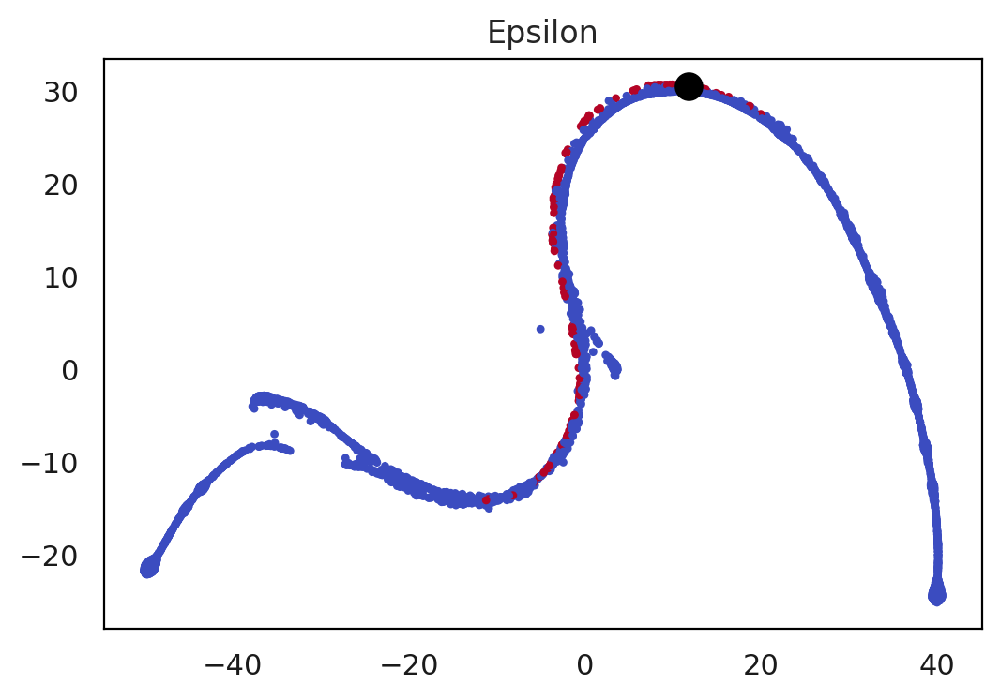

In [83]:
sns.scatterplot(adata.obsm["X_tsne"][:,0], adata.obsm["X_tsne"][:,1],c=cluster_dict["Epsilon"], cmap="coolwarm", linewidth=0, s=10)
plt.scatter(adata.obsm["X_tsne"][:,0][adata.obs.index == target_cell[0]], adata.obsm["X_tsne"][:,1][adata.obs.index == target_cell[0]], c="black", s=100)
plt.title("Epsilon")

Полученная позиция клетки хорошо соотносится с положением кластера на t-SNE, построенном по компонентам диффузии, а также просто идеально ложится на результаты RNA velocity, т.к. в кластере Epsilon стрелочки ведут именно в ту точку, в которой находится наша выбранная клетка. Однако этот факт неудивителен, учитывая то, что мы запускали CellRank на основе RNA velocity. Стрелочки, ведущие в направлении увеличения экспрессии генов, характерных для кластера, сошлись в клетке, в которой суммарная экспрессия этих генов максимальна - всё логично.